#Explainability of ResNet-18 on CIFAR-10

**Overview:**

In this notebook, we evaluate interpretability of ResNet-18 on CIFAR-10. We use multiple explanation methods including Grad-CAM, Grad-CAM++ and Integrated Gradients.

**Architecture Choice**:

ResNet-18 was selected because it is a lightweight yet effective convolutional neural network for image classification on a simple dataset like CIFAR-10. Its residual connections enable stable gradient flow and efficient feature extraction without excessive computational cost. Therfore, it serves as a strong CNN baseline for evaluating explainability methods.

In [ ]:
!pip install torch torchvision captum matplotlib grad-cam


**Model Setup and Fine-Tuning**:

CIFAR-10 dataset was used for evaluation. The 32x32 images were resized to 244x244 to match the model's input requirements.
The model was inititalized with pre-defined weights, and was fine tuned for 5 epochs to achieve an accuracy of 94%.



In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torchvision import models
import time

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)


In [ ]:
# 2. Data preparation
# ResNet-18 expects 224x224 images, normalized like ImageNet
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform_train)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=64,
                                          shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform_test)
testloader = torch.utils.data.DataLoader(testset, batch_size=64,
                                         shuffle=False, num_workers=2)

The weight initialization used in this notebook varies slightly from that in the report, which leads to small differences in accuracy and explainability results.

In [ ]:
# 3. Model setup
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 10)
model = model.to(device)

# 4. Loss & optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

In [ ]:
epochs = 5
for epoch in range(epochs):
    model.train()
    running_loss = 0.0
    start_time = time.time()

    for i, (inputs, labels) in enumerate(trainloader):
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    duration = time.time() - start_time
    print(f"Epoch {epoch+1}/{epochs}, Loss: {running_loss/len(trainloader):.4f}, Time: {duration:.1f}s")

print("Fine-tuning complete.")

# 6. Save checkpoint
torch.save(model.state_dict(), "checkpointsNew/resnet18_epoch5.pth")
print("Checkpoint saved.")

In [ ]:
#loading the model
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from torchvision.models import resnet18


model = resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)
num_ftrs = model.fc.in_features
model.fc = torch.nn.Linear(num_ftrs, 10)
model.load_state_dict(torch.load("checkpointsNew/resnet18_epoch5.pth"))
model.to(device)
model.eval()

# ---------------------------
# CIFAR-10 dataset
# ---------------------------
transform = transforms.Compose([
    transforms.Resize(224),
    transforms.ToTensor()
])
test_dataset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
class_names = test_dataset.classes

In [ ]:
model.eval()
correct, total = 0, 0
with torch.no_grad():
    for images, labels in testloader:
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, preds = torch.max(outputs, 1)
        total += labels.size(0)
        correct += (preds == labels).sum().item()

print(f"Test Accuracy after fine-tuning: {100 * correct / total:.2f}%")

Test Accuracy after fine-tuning: 94.02%


## Grad-CAM: Visualizing model attention

**Concept**:

Grad-CAM highlights the image regions that are most responsible for the model's decision by tracing class-specific gradients through the final feature maps.

**Purpose**:

In this notebook, we use it to interpret spatial focus in the last convolutional block of the fourth residual layer (`target_layer = model.layer4[-1]`). This is the deepest feature extraction layer before global average pooling in ResNet-18.


**Quick references**:
- Selvaraju et al., *Grad-CAM: Visual Explanations from Deep Networks via Gradient-based Localization* (2017).  
- `pytorch-grad-cam` (Jacob Gildenblat) — used for production-ready Grad-CAM utilities.



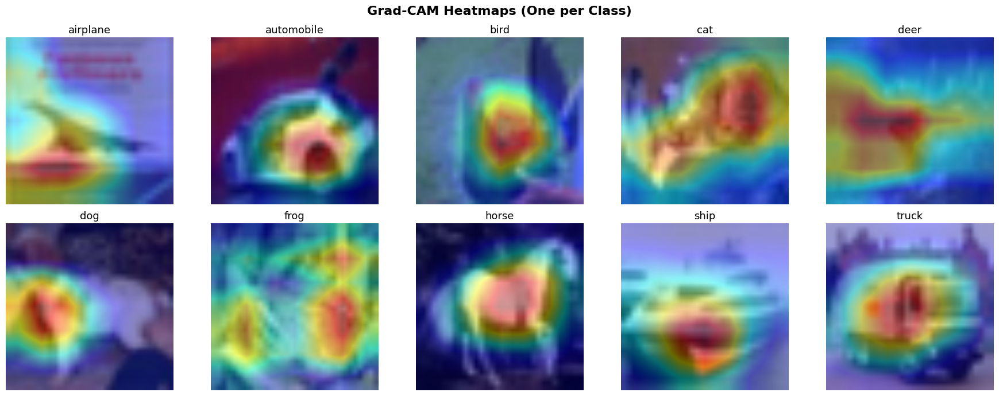

In [ ]:
# ====================================================
# Grad-CAM Visualization (One Heatmap per Class)
# ====================================================

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image
import numpy as np
import matplotlib.pyplot as plt

target_layer = model.layer4[-1]

# Initialize Grad-CAM
cam_pp = GradCAM(model=model, target_layers=[target_layer])

# Helper: unnormalize image for visualization
def unnormalize(img_tensor):
    img = img_tensor.permute(1, 2, 0).cpu().numpy()
    img = np.clip(img, 0, 1)
    return img

# Store one Grad-CAM heatmap per class
representative_heatmaps = {}

for cls in range(10):
    # Take first representative image for this class
    idx = selected_indices[cls][0]
    img, label = test_dataset[idx]
    input_tensor = img.unsqueeze(0).to(device)

    # Get model prediction
    with torch.no_grad():
        pred_class = model(input_tensor).argmax(dim=1).item()

    targets = [ClassifierOutputTarget(pred_class)]
    grayscale_cam_pp = cam_pp(input_tensor=input_tensor, targets=targets)[0]

    # Normalize heatmap
    grayscale_cam_pp = (grayscale_cam_pp - grayscale_cam_pp.min()) / (grayscale_cam_pp.max() - grayscale_cam_pp.min() + 1e-8)

    # Overlay heatmap on image
    rgb_img = unnormalize(img)
    visualization = show_cam_on_image(rgb_img, grayscale_cam_pp, use_rgb=True, image_weight=0.6)

    representative_heatmaps[cls] = visualization

# ====================================================
# Plot all Grad-CAM heatmaps (10 classes)
# ====================================================

fig, axes = plt.subplots(2, 5, figsize=(18, 7))
axes = axes.flatten()

for i, cls in enumerate(range(10)):
    axes[i].imshow(representative_heatmaps[cls])
    axes[i].set_title(f"{class_names[cls]}", fontsize=13)
    axes[i].axis('off')

plt.suptitle("Grad-CAM Heatmaps (One per Class)", fontsize=16, weight='bold')
plt.tight_layout()
plt.show()


**Observations**:

Grad-CAM heatmaps reveals that the model **tends** to focus on the core object region, but sometimes, it highlights the surrounding regions as well.


##Insertion & Deletion Curves

**Concept**:

Insertion measures how the model's confidence rises as the important pixels are added back. Deletion measures how the model's confidence falls as those pixels are removed.

**Purpose**:

 Used to evaluate the **faithfulness** of the explanations i.e. whether the highlighted regions truly influence the model's predictions or not.


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


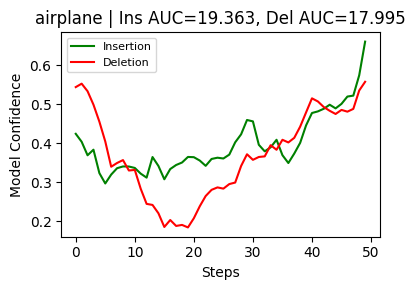

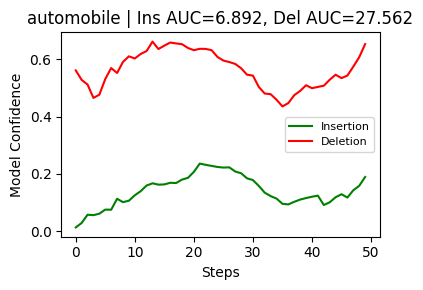

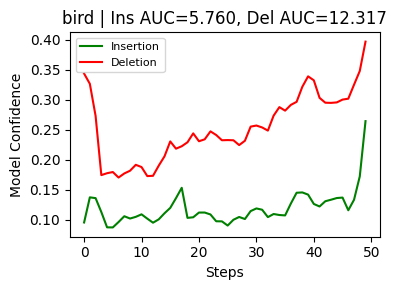

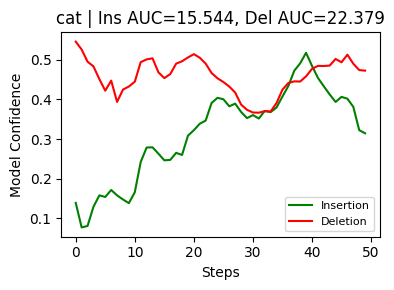

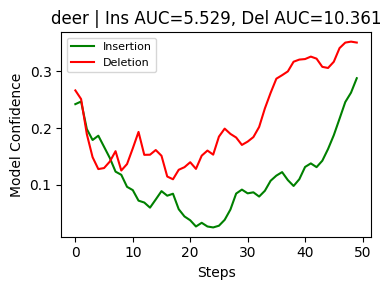

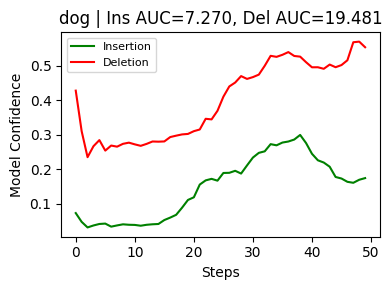

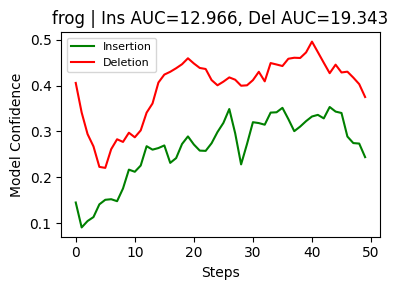

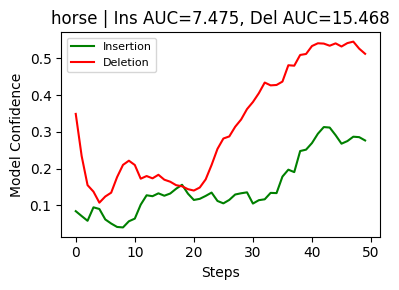

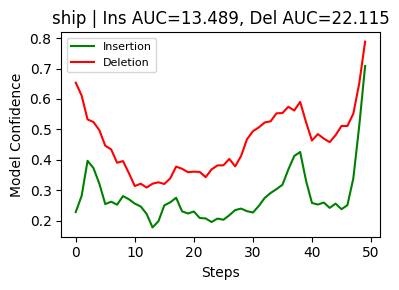

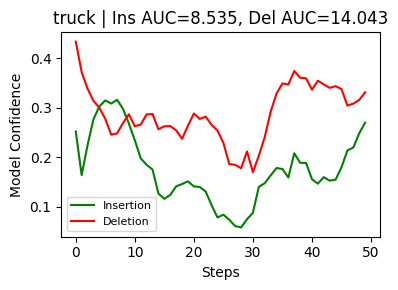

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from torchvision.models import resnet18

from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget


# ---------------------------
# Load model
# ---------------------------
model.eval()

target_layer = model.layer4[-1]

# ---------------------------
# Grad-CAM setup
# ---------------------------
cam = GradCAM(model=model, target_layers=[target_layer])

# ---------------------------
# Select images per class
# ---------------------------
images_per_class = 10
selected_indices = {i: [] for i in range(10)}
for idx, (img, label) in enumerate(test_dataset):
    if len(selected_indices[label]) < images_per_class:
        selected_indices[label].append(idx)
    if all(len(lst) == images_per_class for lst in selected_indices.values()):
        break

# ---------------------------
# Define insertion/deletion functions
# ---------------------------
def insertion_curve(model, input_tensor, baseline, cam, target_category, steps=50):
    input_flat = input_tensor.flatten()
    baseline_flat = baseline.flatten()
    cam_flat = cam.flatten()
    indices = np.argsort(-cam_flat)
    confidences = []
    for i in range(1, steps+1):
        n_pixels = int(i/steps * len(indices))
        mask_indices = indices[:n_pixels].copy()
        new_input = baseline_flat.clone()
        new_input[mask_indices] = input_flat[mask_indices]
        new_input = new_input.view_as(input_tensor)
        with torch.no_grad():
            conf = torch.nn.functional.softmax(model(new_input), dim=1)[0, target_category].item()
        confidences.append(conf)
    return confidences

def deletion_curve(model, input_tensor, baseline, cam, target_category, steps=50):
    input_flat = input_tensor.flatten()
    baseline_flat = baseline.flatten()
    cam_flat = cam.flatten()
    indices = np.argsort(-cam_flat)
    confidences = []
    for i in range(1, steps+1):
        n_pixels = int(i/steps * len(indices))
        new_input = input_flat.clone()
        new_input[indices[:n_pixels]] = baseline_flat[indices[:n_pixels]]
        new_input = new_input.view_as(input_tensor)
        with torch.no_grad():
            conf = torch.nn.functional.softmax(model(new_input), dim=1)[0, target_category].item()
        confidences.append(conf)
    return confidences

# ---------------------------
# Compute class-wise average curves
# ---------------------------
steps = 50
baseline = torch.zeros_like(test_dataset[0][0]).unsqueeze(0).to(device)
class_curves = {}

for cls in range(10):
    insertion_curves = []
    deletion_curves = []
    for idx in selected_indices[cls]:
        img, label = test_dataset[idx]
        input_tensor = img.unsqueeze(0).to(device)
        with torch.no_grad():
            pred_class = model(input_tensor).argmax(dim=1).item()
        targets = [ClassifierOutputTarget(pred_class)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]
        grayscale_cam = (grayscale_cam - grayscale_cam.min()) / (grayscale_cam.max() - grayscale_cam.min() + 1e-8)

        insertion_curves.append(insertion_curve(model, input_tensor, baseline, grayscale_cam, pred_class, steps))
        deletion_curves.append(deletion_curve(model, input_tensor, baseline, grayscale_cam, pred_class, steps))

    avg_insertion = np.mean(insertion_curves, axis=0)
    avg_deletion = np.mean(deletion_curves, axis=0)

    auc_insertion = np.trapz(avg_insertion, dx=1)
    auc_deletion = np.trapz(avg_deletion, dx=1)

    class_curves[cls] = (avg_insertion, avg_deletion, auc_insertion, auc_deletion)

# ---------------------------
# Plot per class with AUC
# ---------------------------
for cls, (ins, dele, auc_ins, auc_del) in class_curves.items():
    plt.figure(figsize=(4, 3))
    plt.plot(range(steps), ins, color='green', label='Insertion')
    plt.plot(range(steps), dele, color='red', label='Deletion')
    plt.xlabel("Steps")
    plt.ylabel("Model Confidence")
    plt.title(f"{class_names[cls]} | Ins AUC={auc_ins:.3f}, Del AUC={auc_del:.3f}")
    plt.legend(fontsize=8)
    plt.tight_layout()
    plt.show()


**Observation**:

Insertion/Deletion curves as well as AUCs are counterintuitive, indicating that the regions highlighted by Grad-CAM weren't that faithful to the model's internal reasoning.

In [ ]:
from sklearn.metrics import auc
import numpy as np

# ---------------------------
# Compute class-wise AUCs
# ---------------------------
class_aucs = {}

for cls, (ins_curve, dele_curve, ins_val, dele_val) in class_curves.items():
    x = np.linspace(0, 1, len(ins_curve))  # normalize x-axis
    ins_auc = auc(x, ins_curve)
    dele_auc = auc(x, dele_curve)
    class_aucs[cls] = (ins_auc, dele_auc)

# ---------------------------
# Print all AUCs per class
# ---------------------------
print("Class-wise AUCs (Insertion, Deletion):")
for cls, (ins_auc, dele_auc) in class_aucs.items():
    print(f"{class_names[cls]}: Insertion AUC = {ins_auc:.4f}, Deletion AUC = {dele_auc:.4f}")

# ---------------------------
# Compute and print mean AUCs
# ---------------------------
mean_insertion_auc = np.mean([v[0] for v in class_aucs.values()])
mean_deletion_auc = np.mean([v[1] for v in class_aucs.values()])

print(f"\nMean Insertion AUC: {mean_insertion_auc:.4f}")
print(f"Mean Deletion AUC: {mean_deletion_auc:.4f}")


Class-wise AUCs (Insertion, Deletion):
airplane: Insertion AUC = 0.3952, Deletion AUC = 0.3672
automobile: Insertion AUC = 0.1407, Deletion AUC = 0.5625
bird: Insertion AUC = 0.1176, Deletion AUC = 0.2514
cat: Insertion AUC = 0.3172, Deletion AUC = 0.4567
deer: Insertion AUC = 0.1128, Deletion AUC = 0.2114
dog: Insertion AUC = 0.1484, Deletion AUC = 0.3976
frog: Insertion AUC = 0.2646, Deletion AUC = 0.3948
horse: Insertion AUC = 0.1525, Deletion AUC = 0.3157
ship: Insertion AUC = 0.2753, Deletion AUC = 0.4513
truck: Insertion AUC = 0.1742, Deletion AUC = 0.2866

Mean Insertion AUC: 0.2098
Mean Deletion AUC: 0.3695


##Entropy & Sparsity
**Concept**:

Entropy measures how spread-out the attention is on a saliency map, while Sparsity quantifies how concentrated it is (i.e. how much of the total area actually carries **meaningful activation**)

For highly focused attributions, the Entropy should be lower while the Sparsity should be higher.


**Purpose**:

Used to quantify how focused or diffused the model's visual explanations are across all the classes.


In [ ]:
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
import numpy as np
import torch
import cv2

# Grad-CAM setup
cam = GradCAM(model=model, target_layers=[target_layer])

def heatmap_sparsity_entropy(cam_map, threshold=0.2):
    if isinstance(cam_map, torch.Tensor):
        cam_map = cam_map.detach().cpu().numpy()

    cam_map = np.clip(cam_map, 0, 1)

    # Sparsity: proportion of pixels above threshold
    sparsity = np.count_nonzero(cam_map > threshold) / cam_map.size

    # Entropy: distribution spread of pixel intensities
    hist, _ = np.histogram(cam_map.flatten(), bins=256, range=(0,1))
    prob = hist / (hist.sum() + 1e-8)
    prob = prob[prob > 0]
    entropy = -np.sum(prob * np.log2(prob)) / np.log2(len(prob))  # normalized 0–1

    return sparsity, entropy


# Compute class-wise Grad-CAM heatmap metrics
class_metrics_cam = {}

for cls in range(10):
    sparsities = []
    entropies = []

    for idx in selected_indices[cls]:
        img, _ = test_dataset[idx]
        input_tensor = img.unsqueeze(0).to(device)

        with torch.no_grad():
            pred_class = model(input_tensor).argmax(dim=1).item()
        targets = [ClassifierOutputTarget(pred_class)]

        # Generate Grad-CAM heatmap
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]
        # Normalize
        grayscale_cam = (grayscale_cam - grayscale_cam.min()) / (grayscale_cam.max() - grayscale_cam.min() + 1e-8)

        sp, ent = heatmap_sparsity_entropy(grayscale_cam)
        sparsities.append(sp)
        entropies.append(ent)

    # Average per class
    class_metrics_cam[cls] = {
        'sparsity': np.mean(sparsities),
        'entropy': np.mean(entropies)
    }

# Print per class
print("Class-wise Grad-CAM heatmap sparsity and entropy:")
for cls, metrics in class_metrics_cam.items():
    print(f"{class_names[cls]} -> Sparsity: {metrics['sparsity']:.4f}, Entropy: {metrics['entropy']:.4f}")

# Overall average
mean_sparsity = np.mean([v['sparsity'] for v in class_metrics_cam.values()])
mean_entropy = np.mean([v['entropy'] for v in class_metrics_cam.values()])
print(f"\nOverall -> Sparsity: {mean_sparsity:.4f}, Entropy: {mean_entropy:.4f}")



Class-wise Grad-CAM heatmap sparsity and entropy:
airplane -> Sparsity: 0.5850, Entropy: 0.9487
automobile -> Sparsity: 0.5607, Entropy: 0.8791
bird -> Sparsity: 0.4891, Entropy: 0.8954
cat -> Sparsity: 0.7078, Entropy: 0.9557
deer -> Sparsity: 0.5423, Entropy: 0.8883
dog -> Sparsity: 0.5394, Entropy: 0.9066
frog -> Sparsity: 0.6138, Entropy: 0.9476
horse -> Sparsity: 0.4551, Entropy: 0.8743
ship -> Sparsity: 0.5867, Entropy: 0.9296
truck -> Sparsity: 0.5140, Entropy: 0.9177

Overall -> Sparsity: 0.5594, Entropy: 0.9143


**Observations**:

The high Entropy suggest that attention was diffused, and the moderate Sparsity suggest that the map activates over a moderate area. This was seen in the Insertion/deletion graph as well because deleting or inserting a few pixels didnt cause a sharp confidence change.


Note: The Entropy values are normalized here, hence they're in the range of 0-1

##Grad-CAM++: Visualizing model attention

**Concept**:

Grad-CAM++ refines Grad-CAM by incorporating higher-order gradient information. This enhances localization and handling of multiple object instances.

**Purpose**:

Used to asses how finely the model distinguishes multiple features or parts within an image.

**Quick references**:

Chattopadhyay et al., Grad-CAM++: Improved Visual Explanations for Deep Convolutional Networks, WACV 2018.

Gildenblat, pytorch-grad-cam library — robust reference implementation.

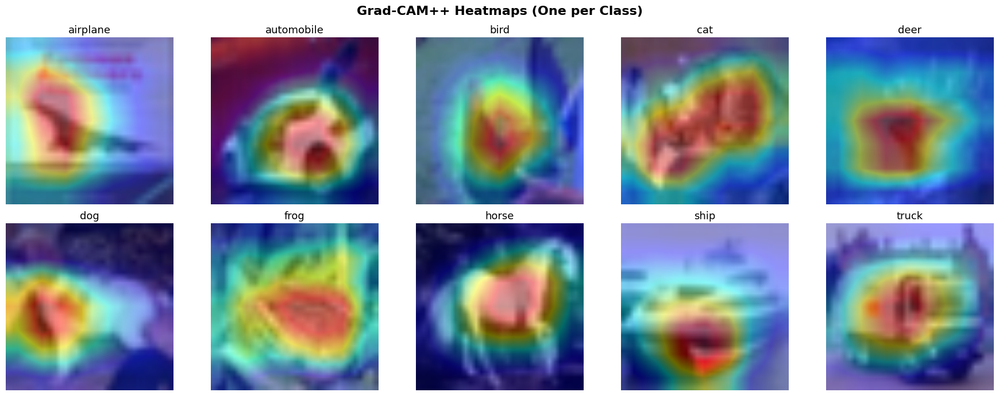

In [ ]:
# ====================================================
# Grad-CAM++ Visualization (One Heatmap per Class)
# ====================================================

from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.image import show_cam_on_image, preprocess_image
import numpy as np
import matplotlib.pyplot as plt

# Initialize Grad-CAM++
cam_pp = GradCAMPlusPlus(model=model, target_layers=[target_layer])

# Helper: unnormalize image for visualization
def unnormalize(img_tensor):
    img = img_tensor.permute(1, 2, 0).cpu().numpy()
    img = np.clip(img, 0, 1)
    return img

# Store one Grad-CAM++ heatmap per class
representative_heatmaps = {}

for cls in range(10):
    # Take first representative image for this class
    idx = selected_indices[cls][0]
    img, label = test_dataset[idx]
    input_tensor = img.unsqueeze(0).to(device)

    # Get model prediction
    with torch.no_grad():
        pred_class = model(input_tensor).argmax(dim=1).item()

    targets = [ClassifierOutputTarget(pred_class)]
    grayscale_cam_pp = cam_pp(input_tensor=input_tensor, targets=targets)[0]

    # Normalize heatmap
    grayscale_cam_pp = (grayscale_cam_pp - grayscale_cam_pp.min()) / (grayscale_cam_pp.max() - grayscale_cam_pp.min() + 1e-8)

    # Overlay heatmap on image
    rgb_img = unnormalize(img)
    visualization = show_cam_on_image(rgb_img, grayscale_cam_pp, use_rgb=True, image_weight=0.6)

    representative_heatmaps[cls] = visualization

# ====================================================
# Plot all Grad-CAM++ heatmaps (10 classes)
# ====================================================

fig, axes = plt.subplots(2, 5, figsize=(18, 7))
axes = axes.flatten()

for i, cls in enumerate(range(10)):
    axes[i].imshow(representative_heatmaps[cls])
    axes[i].set_title(f"{class_names[cls]}", fontsize=13)
    axes[i].axis('off')

plt.suptitle("Grad-CAM++ Heatmaps (One per Class)", fontsize=16, weight='bold')
plt.tight_layout()
plt.show()


**Observations**:

The heatmaps produced by Grad-CAM++ may seem similar to Grad-CAM, but there is a minor difference: the Grad-CAM++ heatmaps tend to highlight more of the core object region, almost completely avoiding the surrounding regions. This indicates how it relies more on disciminative features instead of contextual clues.  

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


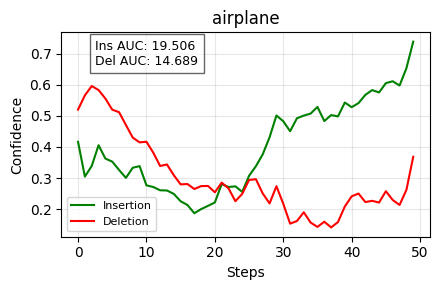

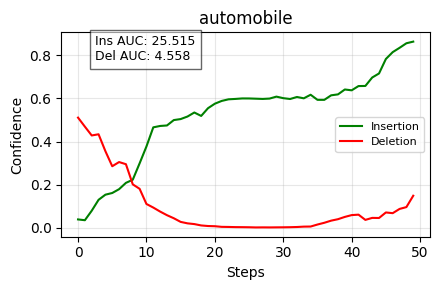

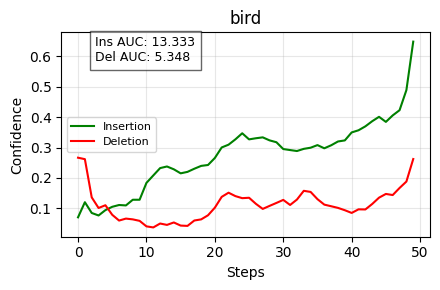

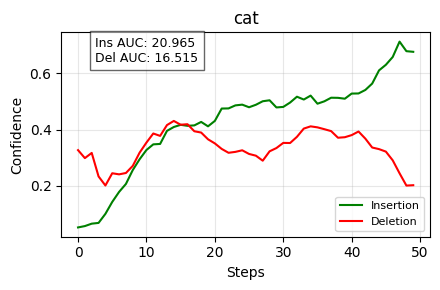

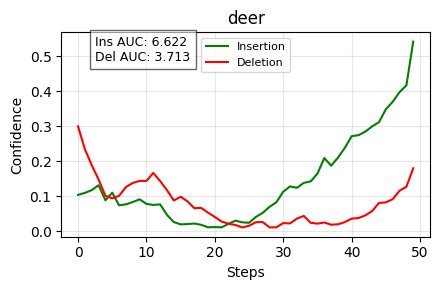

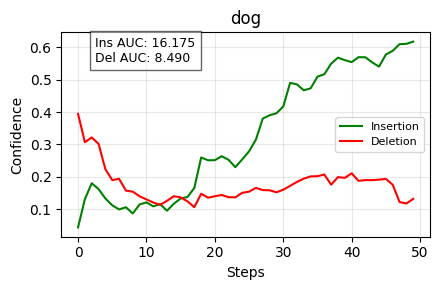

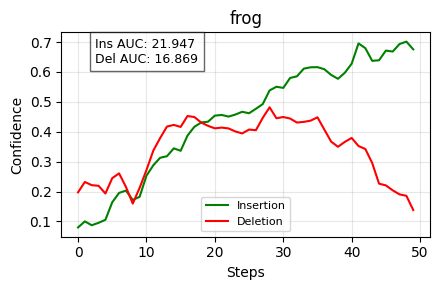

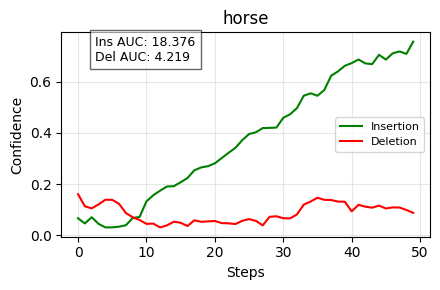

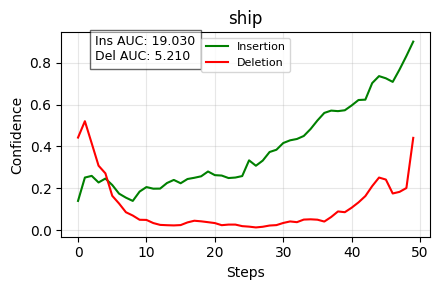

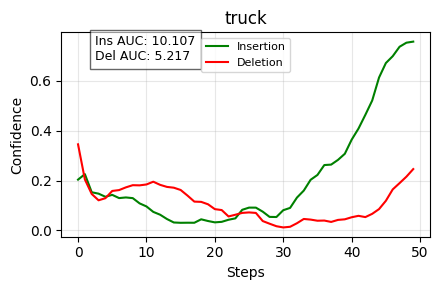

Grad-CAM++ Class-wise AUCs (Insertion, Deletion):
airplane: Insertion AUC = 19.5061, Deletion AUC = 14.6888
automobile: Insertion AUC = 25.5148, Deletion AUC = 4.5575
bird: Insertion AUC = 13.3326, Deletion AUC = 5.3481
cat: Insertion AUC = 20.9655, Deletion AUC = 16.5151
deer: Insertion AUC = 6.6216, Deletion AUC = 3.7134
dog: Insertion AUC = 16.1747, Deletion AUC = 8.4902
frog: Insertion AUC = 21.9473, Deletion AUC = 16.8695
horse: Insertion AUC = 18.3759, Deletion AUC = 4.2192
ship: Insertion AUC = 19.0302, Deletion AUC = 5.2097
truck: Insertion AUC = 10.1073, Deletion AUC = 5.2175

Mean Insertion AUC: 17.1576
Mean Deletion AUC: 8.4829


In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from torchvision.models import resnet18
from pytorch_grad_cam import GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
import cv2
from sklearn.metrics import auc

model.eval()

target_layer = model.layer4[-1]

# ---------------------------
# Grad-CAM setup
# ---------------------------
cam = GradCAMPlusPlus(model=model, target_layers=[target_layer])

# ---------------------------
# Select images per class
# ---------------------------
images_per_class = 10
selected_indices = {i: [] for i in range(10)}
for idx, (img, label) in enumerate(test_dataset):
    if len(selected_indices[label]) < images_per_class:
        selected_indices[label].append(idx)
    if all(len(lst) == images_per_class for lst in selected_indices.values()):
        break

# ---------------------------
# Helper functions
# ---------------------------
def prepare_mask(cam, input_tensor):
    H, W = input_tensor.shape[2], input_tensor.shape[3]
    cam_resized = cv2.resize(cam, (W, H))
    cam_norm = (cam_resized - cam_resized.min()) / (cam_resized.max() - cam_resized.min() + 1e-8)
    cam_tensor = torch.tensor(cam_norm, dtype=torch.float32, device=device)
    return cam_tensor

def deletion_curve(model, input_tensor, baseline, cam, target_category, steps=50):
    model.eval()
    input_tensor = input_tensor.to(device)
    baseline = baseline.to(device)
    cam_mask = prepare_mask(cam, input_tensor)
    H, W = cam_mask.shape
    cam_flat = cam_mask.flatten()
    indices = torch.argsort(cam_flat, descending=True)
    scores = []

    for step in range(steps):
        n_pixels = int((step+1)/steps * len(indices))
        mask_flat = torch.zeros(H*W, device=device)
        mask_flat[indices[:n_pixels]] = 1
        mask = mask_flat.view(1, 1, H, W).expand_as(input_tensor)

        modified = input_tensor * (1 - mask) + baseline * mask
        with torch.no_grad():
            conf = torch.softmax(model(modified), dim=1)[0, target_category].item()
            scores.append(conf)
    return scores

def insertion_curve(model, input_tensor, baseline, cam, target_category, steps=50):
    model.eval()
    input_tensor = input_tensor.to(device)
    baseline = baseline.to(device)
    cam_mask = prepare_mask(cam, input_tensor)
    H, W = cam_mask.shape
    cam_flat = cam_mask.flatten()
    indices = torch.argsort(cam_flat, descending=True)
    scores = []

    for step in range(steps):
        n_pixels = int((step+1)/steps * len(indices))
        mask_flat = torch.zeros(H*W, device=device)
        mask_flat[indices[:n_pixels]] = 1
        mask = mask_flat.view(1, 1, H, W).expand_as(input_tensor)

        modified = baseline * (1 - mask) + input_tensor * mask
        with torch.no_grad():
            conf = torch.softmax(model(modified), dim=1)[0, target_category].item()
            scores.append(conf)
    return scores

# ---------------------------
# Compute class-wise curves
# ---------------------------
steps = 50
baseline = torch.zeros_like(test_dataset[0][0]).unsqueeze(0).to(device)
class_curves = {}

for cls in range(10):
    insertion_curves = []
    deletion_curves = []
    for idx in selected_indices[cls]:
        img, label = test_dataset[idx]
        input_tensor = img.unsqueeze(0).to(device)
        with torch.no_grad():
            pred_class = model(input_tensor).argmax(dim=1).item()
        targets = [ClassifierOutputTarget(pred_class)]
        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]

        insertion_curves.append(insertion_curve(model, input_tensor, baseline, grayscale_cam, pred_class, steps))
        deletion_curves.append(deletion_curve(model, input_tensor, baseline, grayscale_cam, pred_class, steps))

    avg_insertion = np.mean(insertion_curves, axis=0)
    avg_deletion = np.mean(deletion_curves, axis=0)
    class_curves[cls] = (avg_insertion, avg_deletion)

# ---------------------------
# Plot curves and compute AUCs (compact version)
# ---------------------------
class_aucs = {}
for cls, (ins, dele) in class_curves.items():
    ins_auc = auc(range(steps), ins)
    dele_auc = auc(range(steps), dele)
    class_aucs[cls] = (ins_auc, dele_auc)

    plt.figure(figsize=(4.5, 3))  # smaller, cleaner plot
    plt.plot(range(steps), ins, color='green', label='Insertion')
    plt.plot(range(steps), dele, color='red', label='Deletion')
    plt.xlabel("Steps")
    plt.ylabel("Confidence")
    plt.title(f"{class_names[cls]}")

    # Display AUC values directly on the plot
    text_x = steps * 0.05
    text_y = max(max(ins), max(dele)) * 0.9
    plt.text(text_x, text_y,
             f"Ins AUC: {ins_auc:.3f}\nDel AUC: {dele_auc:.3f}",
             fontsize=9, color='black', bbox=dict(facecolor='white', alpha=0.6))

    plt.legend(fontsize=8)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()

# ---------------------------
# Print summary AUCs
# ---------------------------
print("Grad-CAM++ Class-wise AUCs (Insertion, Deletion):")
for cls, (ins_auc, dele_auc) in class_aucs.items():
    print(f"{class_names[cls]}: Insertion AUC = {ins_auc:.4f}, Deletion AUC = {dele_auc:.4f}")

mean_ins = np.mean([v[0] for v in class_aucs.values()])
mean_del = np.mean([v[1] for v in class_aucs.values()])

print(f"\nMean Insertion AUC: {mean_ins:.4f}")
print(f"Mean Deletion AUC: {mean_del:.4f}")


**Observations**:

The Insertion/Deletion curves as well as the AUCs are highly intuitve, suggesting that the regions highlighted by Grad-CAM++ strongly influence the model's predictions.

In [ ]:
import numpy as np
import torch

# --- Function ---
def heatmap_sparsity_entropy(cam_map, threshold=0.2):
    if isinstance(cam_map, torch.Tensor):
        cam_map = cam_map.detach().cpu().numpy()

    cam_map = np.clip(cam_map, 0, 1)

    # Sparsity: proportion of pixels above threshold
    sparsity = np.count_nonzero(cam_map > threshold) / cam_map.size

    # Entropy: distribution spread of pixel intensities
    hist, _ = np.histogram(cam_map.flatten(), bins=256, range=(0,1))
    prob = hist / (hist.sum() + 1e-8)
    prob = prob[prob > 0]
    entropy = -np.sum(prob * np.log2(prob)) / np.log2(len(prob))  # normalized 0–1

    return sparsity, entropy


# --- Compute Grad-CAM++ heatmap sparsity & entropy per class ---
class_metrics_gradcampp = {}

print("\nComputing Grad-CAM++ heatmap sparsity and entropy per class...\n")
for cls in range(10):
    sparsities, entropies = [], []

    for idx in selected_indices[cls]:
        img, _ = test_dataset[idx]
        input_tensor = img.unsqueeze(0).to(device)
        targets = [ClassifierOutputTarget(cls)]

        grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]
        cam_norm = (grayscale_cam - grayscale_cam.min()) / (grayscale_cam.max() - grayscale_cam.min() + 1e-8)

        s, e = heatmap_sparsity_entropy(cam_norm)
        sparsities.append(s)
        entropies.append(e)

    class_metrics_gradcampp[cls] = {
        "sparsity": np.mean(sparsities),
        "entropy": np.mean(entropies)
    }

# --- Print results ---
print("\nGrad-CAM++ Class-wise Heatmap Sparsity and Entropy:")
for cls, metrics in class_metrics_gradcampp.items():
    print(f"{class_names[cls]} → Sparsity: {metrics['sparsity']:.4f}, Entropy: {metrics['entropy']:.4f}")

mean_sparsity = np.mean([v["sparsity"] for v in class_metrics_gradcampp.values()])
mean_entropy = np.mean([v["entropy"] for v in class_metrics_gradcampp.values()])
print(f"\nOverall → Sparsity: {mean_sparsity:.4f}, Entropy: {mean_entropy:.4f}")



Computing Grad-CAM++ heatmap sparsity and entropy per class...


Grad-CAM++ Class-wise Heatmap Sparsity and Entropy:
airplane → Sparsity: 0.6161, Entropy: 0.9470
automobile → Sparsity: 0.4142, Entropy: 0.7911
bird → Sparsity: 0.4892, Entropy: 0.8869
cat → Sparsity: 0.6782, Entropy: 0.9369
deer → Sparsity: 0.3339, Entropy: 0.7344
dog → Sparsity: 0.4539, Entropy: 0.8966
frog → Sparsity: 0.4071, Entropy: 0.8168
horse → Sparsity: 0.3825, Entropy: 0.7793
ship → Sparsity: 0.6187, Entropy: 0.9444
truck → Sparsity: 0.3577, Entropy: 0.7547

Overall → Sparsity: 0.4752, Entropy: 0.8488


**Observation**:

The lower Entropy and lower Sparsity than Grad-CAM suggests that the Grad-CAM++ heatmaps are more structured than before (lower Entropy) and the model relies on fewer, more specific regions (lower Sparsity).

##Integrated Gradients: Visualizing model attention

**Concepts**:

Integrated Gradients captures pixel-wise contributions by accumulating gradients along a path from a baseline (usually a zero image) to the actual input.

**Purpose**:

Used to quantify pixel-level contrbution, providing a fine-grained understanding of sensitivity.


**Quick references**:

Sundararajan et al., Axiomatic Attribution for Deep Networks (ICML 2017).

Captum (PyTorch) — Official interpretability library used for the IG implementation.

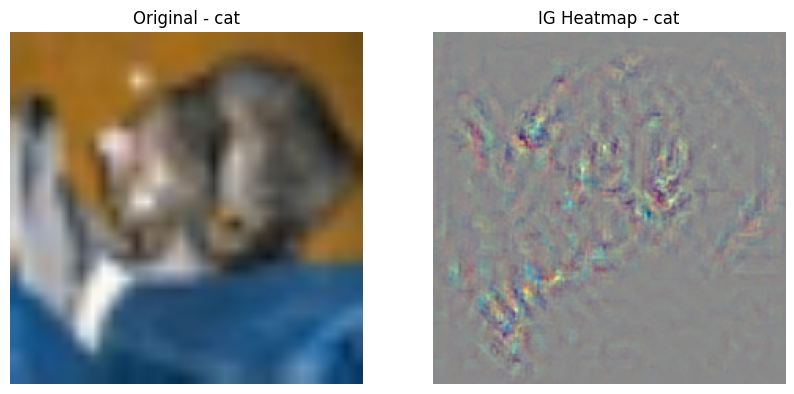

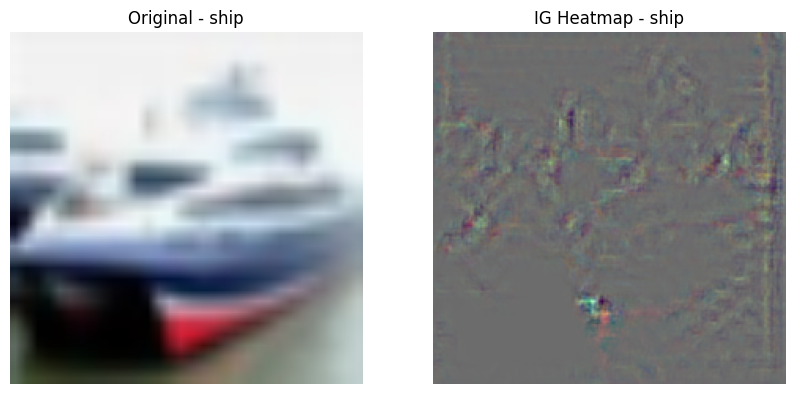

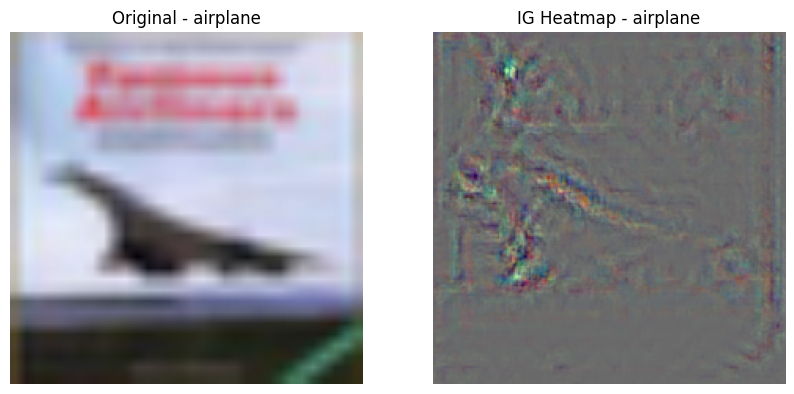

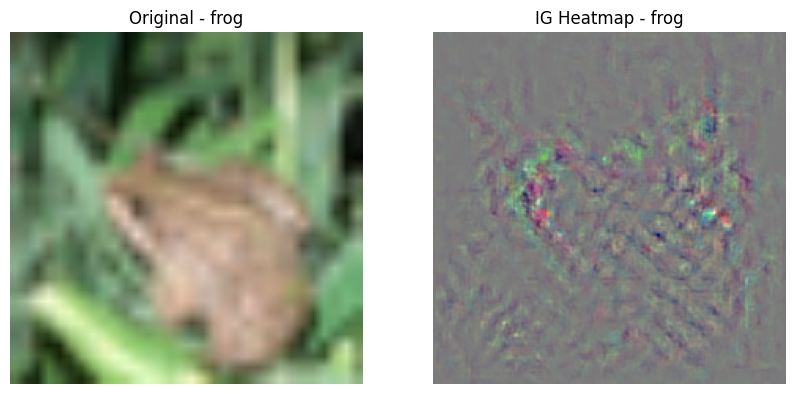

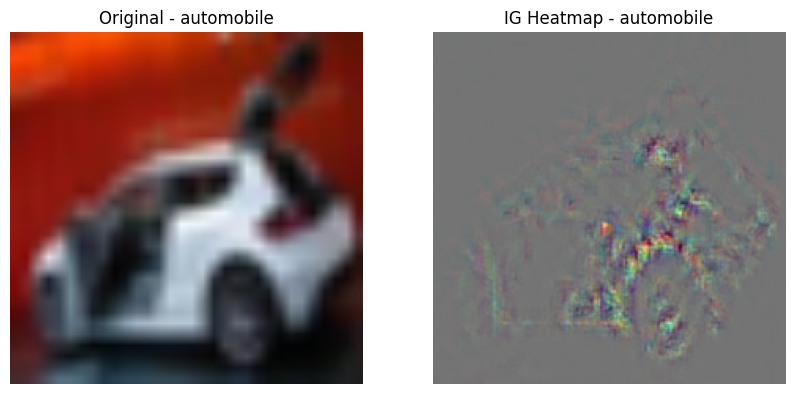

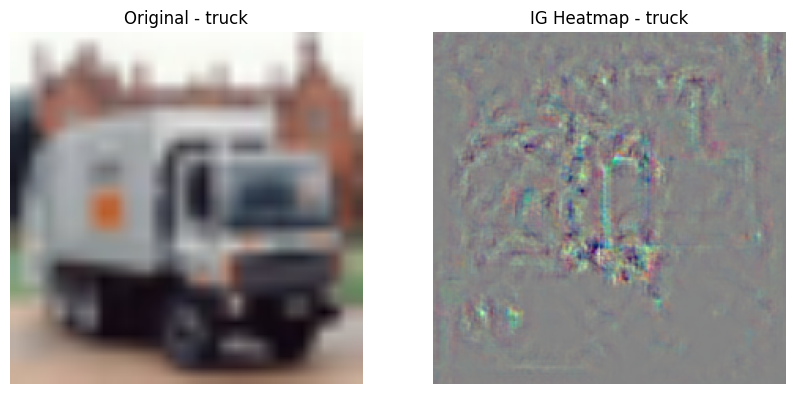

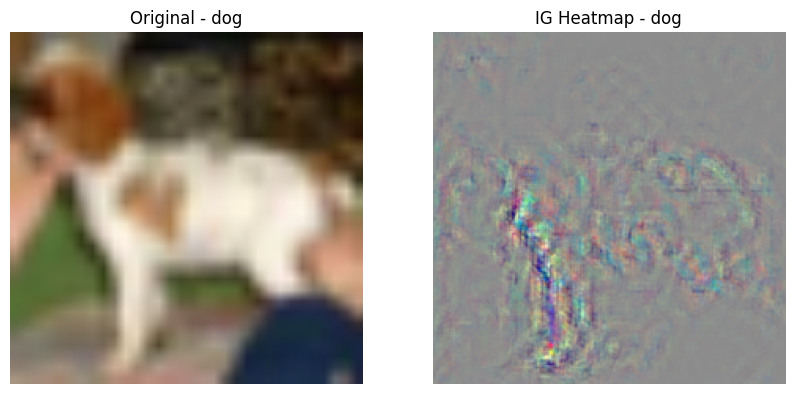

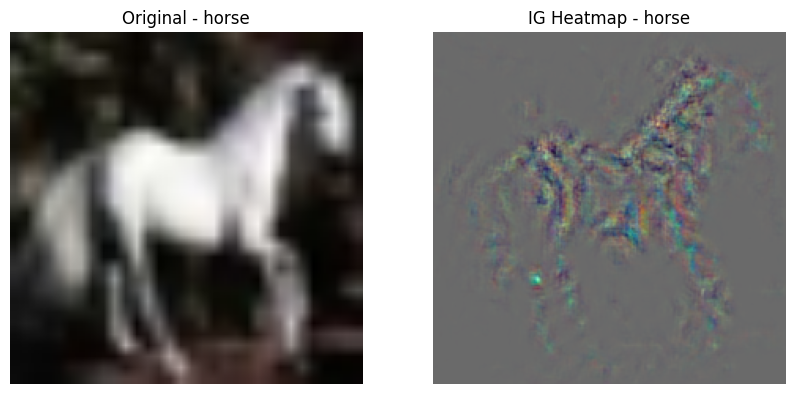

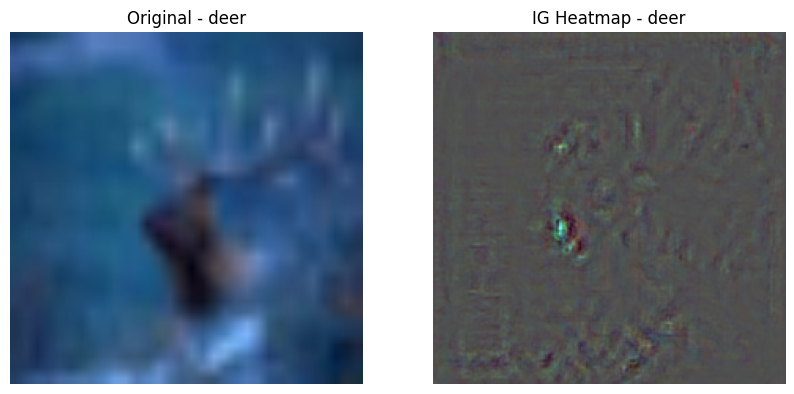

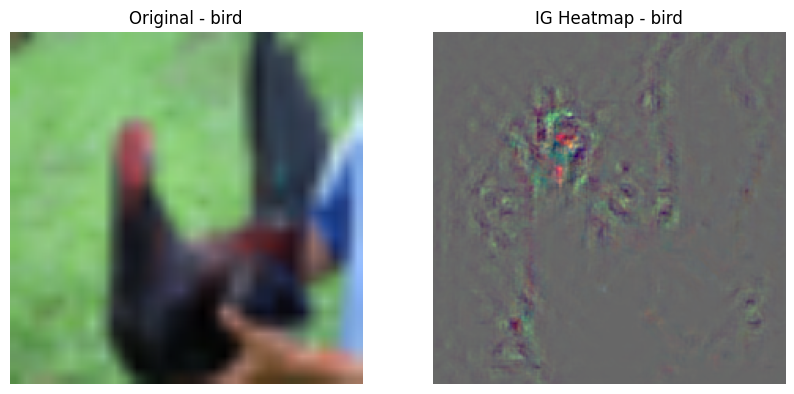

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
from torchvision.models import resnet18
from captum.attr import IntegratedGradients, visualization as viz


# ---------------------------
# Load model
# ---------------------------
model.eval()

# ---------------------------
# Select one image per class
# ---------------------------
images_per_class = 1
selected_indices = {}
for idx, (img, label) in enumerate(test_dataset):
    if label not in selected_indices:
        selected_indices[label] = idx
    if len(selected_indices) == 10:
        break

# ---------------------------
# Integrated Gradients
# ---------------------------
ig = IntegratedGradients(model)

baseline = torch.zeros(1, 3, 224, 224).to(device)  # black image baseline

for cls, idx in selected_indices.items():
    img, label = test_dataset[idx]
    input_tensor = img.unsqueeze(0).to(device)

    # Compute attributions
    attr, delta = ig.attribute(input_tensor, baseline, target=label, return_convergence_delta=True)
    attr = attr.detach().cpu().numpy()[0].transpose(1,2,0)  # HWC

    # Normalize for visualization
    attr_norm = (attr - attr.min()) / (attr.max() - attr.min() + 1e-8)

    # Original image (convert tensor to HWC for plt)
    orig_img = img.permute(1,2,0).numpy()
    orig_img = (orig_img - orig_img.min()) / (orig_img.max() - orig_img.min() + 1e-8)

    # Plot side by side
    plt.figure(figsize=(10,5))

    plt.subplot(1,2,1)
    plt.imshow(orig_img)
    plt.title(f"Original - {class_names[cls]}")
    plt.axis('off')

    plt.subplot(1,2,2)
    plt.imshow(attr_norm)
    plt.title(f"IG Heatmap - {class_names[cls]}")
    plt.axis('off')

    plt.show()


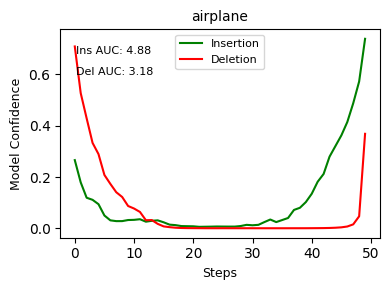

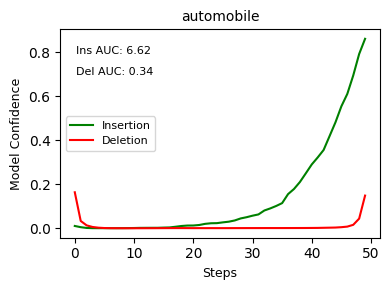

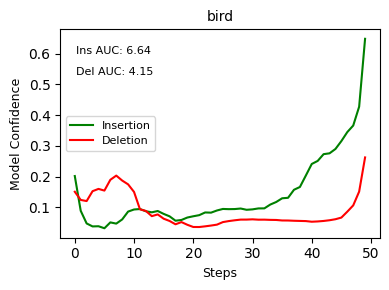

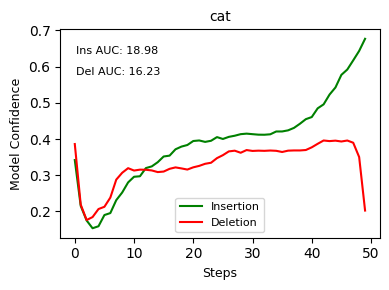

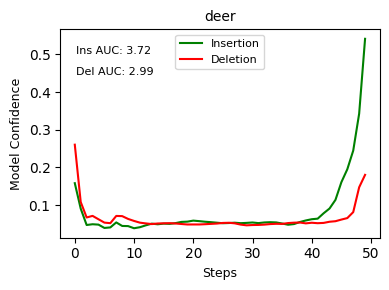

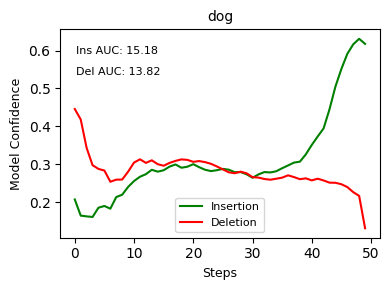

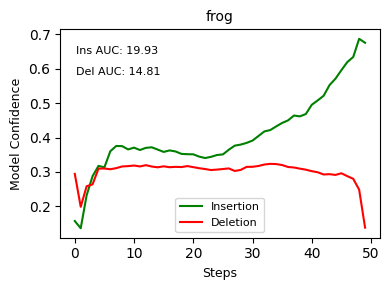

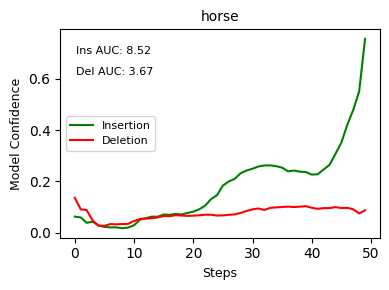

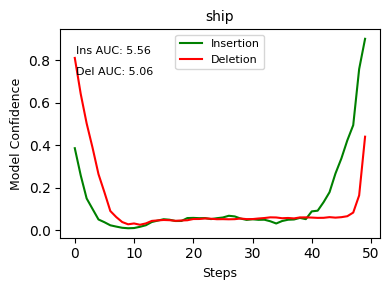

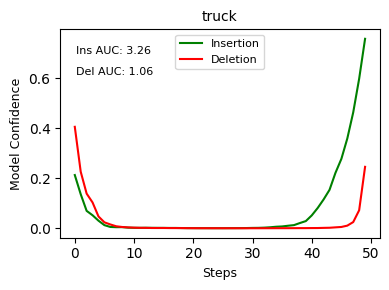


Class-wise Insertion & Deletion AUCs:

airplane: Insertion AUC = 4.8845, Deletion AUC = 3.1842
automobile: Insertion AUC = 6.6157, Deletion AUC = 0.3356
bird: Insertion AUC = 6.6372, Deletion AUC = 4.1480
cat: Insertion AUC = 18.9802, Deletion AUC = 16.2302
deer: Insertion AUC = 3.7241, Deletion AUC = 2.9853
dog: Insertion AUC = 15.1822, Deletion AUC = 13.8161
frog: Insertion AUC = 19.9310, Deletion AUC = 14.8148
horse: Insertion AUC = 8.5160, Deletion AUC = 3.6716
ship: Insertion AUC = 5.5560, Deletion AUC = 5.0592
truck: Insertion AUC = 3.2574, Deletion AUC = 1.0550


In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
from torchvision.models import resnet18
from captum.attr import IntegratedGradients
from sklearn.metrics import auc


# ---------------------------
# Select 5 images per class
# ---------------------------
images_per_class = 10
selected_indices = {i: [] for i in range(10)}
for idx, (img, label) in enumerate(test_dataset):
    if len(selected_indices[label]) < images_per_class:
        selected_indices[label].append(idx)
    if all(len(lst) == images_per_class for lst in selected_indices.values()):
        break

# ---------------------------
# IG setup
# ---------------------------
ig = IntegratedGradients(model)
baseline = torch.zeros(1, 3, 224, 224).to(device)

# ---------------------------
# Define insertion / deletion functions
# ---------------------------
def insertion_curve(model, input_tensor, attr, baseline, target_class, steps=50):
    input_flat = input_tensor.flatten()
    baseline_flat = baseline.flatten()
    attr_flat = np.abs(attr.flatten())
    indices = np.argsort(-attr_flat)
    confidences = []
    for i in range(1, steps + 1):
        n_pixels = int(i / steps * len(indices))
        mask_indices = indices[:n_pixels].copy()
        new_input = baseline_flat.clone()
        new_input[mask_indices] = input_flat[mask_indices]
        new_input = new_input.view_as(input_tensor)
        with torch.no_grad():
            conf = torch.nn.functional.softmax(model(new_input), dim=1)[0, target_class].item()
        confidences.append(conf)
    return confidences


def deletion_curve(model, input_tensor, attr, baseline, target_class, steps=50):
    input_flat = input_tensor.flatten()
    baseline_flat = baseline.flatten()
    attr_flat = np.abs(attr.flatten())
    indices = np.argsort(-attr_flat)
    confidences = []
    for i in range(1, steps + 1):
        n_pixels = int(i / steps * len(indices))
        new_input = input_flat.clone()
        new_input[indices[:n_pixels]] = baseline_flat[indices[:n_pixels]]
        new_input = new_input.view_as(input_tensor)
        with torch.no_grad():
            conf = torch.nn.functional.softmax(model(new_input), dim=1)[0, target_class].item()
        confidences.append(conf)
    return confidences


# ---------------------------
# Compute curves per class
# ---------------------------
steps = 50
class_curves = {}
class_auc = {}

for cls, indices in selected_indices.items():
    insertion_curves = []
    deletion_curves = []
    for idx in indices:
        img, label = test_dataset[idx]
        input_tensor = img.unsqueeze(0).to(device)

        with torch.no_grad():
            output = torch.nn.functional.softmax(model(input_tensor), dim=1)
        pred_class = output.argmax(dim=1).item()

        # IG attribution
        attr, delta = ig.attribute(input_tensor, baseline, target=pred_class, return_convergence_delta=True)
        attr_np = attr.squeeze().cpu().detach().numpy()

        # Compute curves
        ins_curve = insertion_curve(model, input_tensor, attr_np, baseline, pred_class, steps)
        del_curve = deletion_curve(model, input_tensor, attr_np, baseline, pred_class, steps)

        insertion_curves.append(ins_curve)
        deletion_curves.append(del_curve)

    # Average over 5 images
    avg_ins = np.mean(insertion_curves, axis=0)
    avg_del = np.mean(deletion_curves, axis=0)
    class_curves[cls] = (avg_ins, avg_del)

    # Compute AUCs
    auc_ins = auc(range(steps), avg_ins)
    auc_del = auc(range(steps), avg_del)
    class_auc[cls] = {'Insertion AUC': auc_ins, 'Deletion AUC': auc_del}

# ---------------------------
# Plot per class
# ---------------------------
for cls, (ins, dele) in class_curves.items():
    plt.figure(figsize=(4, 3))  # smaller figure size
    plt.plot(range(steps), ins, label='Insertion', color='green')
    plt.plot(range(steps), dele, label='Deletion', color='red')
    plt.xlabel("Steps", fontsize=9)
    plt.ylabel("Model Confidence", fontsize=9)
    plt.title(f"{class_names[cls]}", fontsize=10)
    plt.legend(fontsize=8)

    # Add AUC text in black
    auc_ins = class_auc[cls]['Insertion AUC']
    auc_del = class_auc[cls]['Deletion AUC']
    plt.text(0.05, 0.88, f"Ins AUC: {auc_ins:.2f}", transform=plt.gca().transAxes, fontsize=8, color='black')
    plt.text(0.05, 0.78, f"Del AUC: {auc_del:.2f}", transform=plt.gca().transAxes, fontsize=8, color='black')

    plt.tight_layout()
    plt.show()

# ---------------------------
# Print AUCs (summary)
# ---------------------------
print("\nClass-wise Insertion & Deletion AUCs:\n")
for cls, auc_vals in class_auc.items():
    print(f"{class_names[cls]}: Insertion AUC = {auc_vals['Insertion AUC']:.4f}, Deletion AUC = {auc_vals['Deletion AUC']:.4f}")


**Observations**:

The sharp drop in the deletion curve in the beginning and the sharp rise in the insertion curve in the end suggest that the model relies heavily on a small set of very crucial pixels.

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import numpy as np
from torchvision.models import resnet18
from captum.attr import IntegratedGradients
from scipy.stats import entropy


# ---------------------------
# Select 5 images per class
# ---------------------------
images_per_class = 10
selected_indices = {i: [] for i in range(10)}
for idx, (img, label) in enumerate(test_dataset):
    if len(selected_indices[label]) < images_per_class:
        selected_indices[label].append(idx)
    if all(len(lst) == images_per_class for lst in selected_indices.values()):
        break

# ---------------------------
# IG setup
# ---------------------------
ig = IntegratedGradients(model)
baseline = torch.zeros(1, 3, 224, 224).to(device)

# ---------------------------
# Compute sparsity and entropy
# ---------------------------
def compute_sparsity(attr, threshold=0.2):
    attr = np.abs(attr)
    attr = attr / (attr.max() + 1e-8)
    non_zero = np.count_nonzero(attr > threshold)
    return non_zero / attr.size


def compute_entropy(attr):
    attr_flat = np.abs(attr.flatten())
    attr_sum = attr_flat.sum()
    if attr_sum == 0:
        return 0.0
    attr_prob = attr_flat / attr_sum
    attr_prob = attr_prob[attr_prob > 0]
    return -np.sum(attr_prob * np.log2(attr_prob)) / np.log2(len(attr_prob))


# ---------------------------
# Compute class-wise metrics
# ---------------------------
class_metrics = {}

for cls, indices in selected_indices.items():
    sparsities = []
    entropies = []
    for idx in indices:
        img, label = test_dataset[idx]
        input_tensor = img.unsqueeze(0).to(device)
        with torch.no_grad():
            output = torch.nn.functional.softmax(model(input_tensor), dim=1)
        pred_class = output.argmax(dim=1).item()

        # IG attribution
        attr, delta = ig.attribute(input_tensor, baseline, target=pred_class, return_convergence_delta=True)
        attr_np = attr.squeeze().cpu().detach().numpy()

        # Compute metrics
        sparsities.append(compute_sparsity(attr_np))
        entropies.append(compute_entropy(attr_np))

    # Average per class
    class_metrics[cls] = {
        'Sparsity': np.mean(sparsities),
        'Entropy': np.mean(entropies)
    }

# ---------------------------
# Print results
# ---------------------------
print("Integrated Gradients — Class-wise Sparsity & Entropy:\n")
for cls, metrics in class_metrics.items():
    print(f"{class_names[cls]:<10}: Sparsity = {metrics['Sparsity']:.4f}, Entropy = {metrics['Entropy']:.4f}")

# ---------------------------
# Overall mean
# ---------------------------
mean_sparsity = np.mean([m['Sparsity'] for m in class_metrics.values()])
mean_entropy = np.mean([m['Entropy'] for m in class_metrics.values()])

print(f"\nOverall Mean → Sparsity = {mean_sparsity:.4f}, Entropy = {mean_entropy:.4f}")


Integrated Gradients — Class-wise Sparsity & Entropy:

airplane  : Sparsity = 0.0182, Entropy = 0.9368
automobile: Sparsity = 0.0187, Entropy = 0.9325
bird      : Sparsity = 0.0181, Entropy = 0.9319
cat       : Sparsity = 0.0219, Entropy = 0.9388
deer      : Sparsity = 0.0124, Entropy = 0.9436
dog       : Sparsity = 0.0225, Entropy = 0.9432
frog      : Sparsity = 0.0207, Entropy = 0.9425
horse     : Sparsity = 0.0144, Entropy = 0.9287
ship      : Sparsity = 0.0127, Entropy = 0.9374
truck     : Sparsity = 0.0134, Entropy = 0.9455

Overall Mean → Sparsity = 0.0173, Entropy = 0.9381


**Observations**:

These metrics complement the observations made for Insertion/Deletion curves. The extremely low Sparsity suggests that the model relies heavily on few set of pixels. The high Entropy suggests that, amongst that tiny pixels, the attribution is smoothly spread.

**Note**:

In the report, it was dicussed how Grad-CAM tends to be a more effective explainability method for datasets like CIFAR-10, due to their coarse, single-object nature. This is because Grad-CAM highlights the core object region, whereas Grad-CAM++ often included contextual clues as well.

However, due to differences in weight initialization and improved convergence in this notebook, Grad-CAM++ performs better as it relies less on contextual information. Thus, the underlying reasoning remains consistent: the most suitable explainability method for a dataset like CIFAR-10 is one that focuses more on the core object region and less on the surrounding pixels.




##Misclassified images:

For images that were correctly classified, the heatmaps largely coincided, but for misclassified images, there is a significant divergence in the heatmaps.

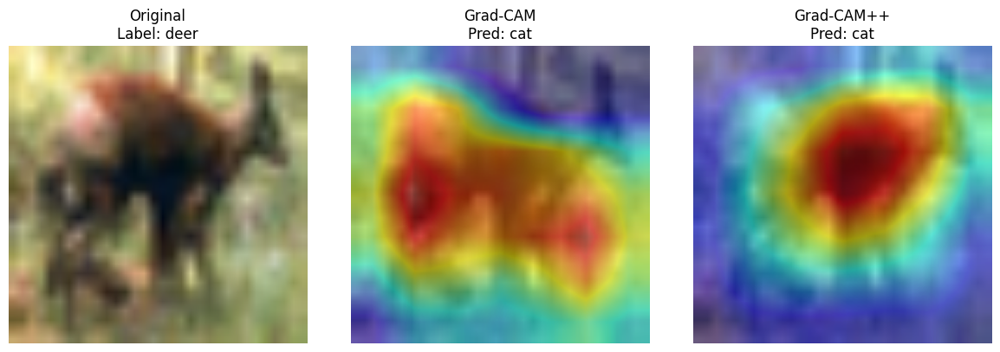

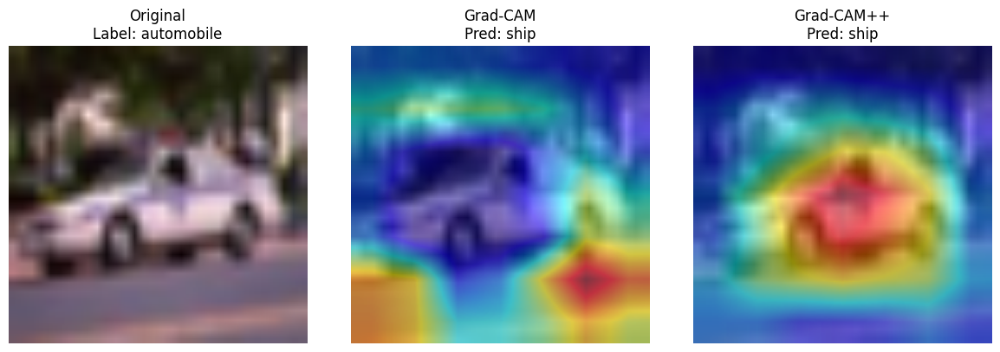

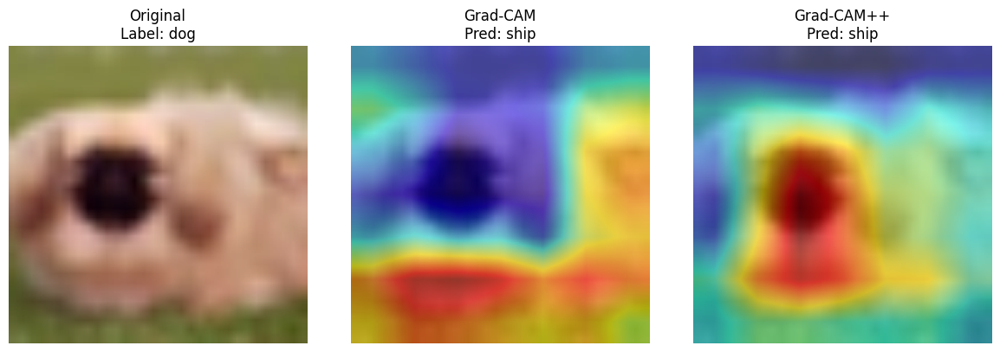

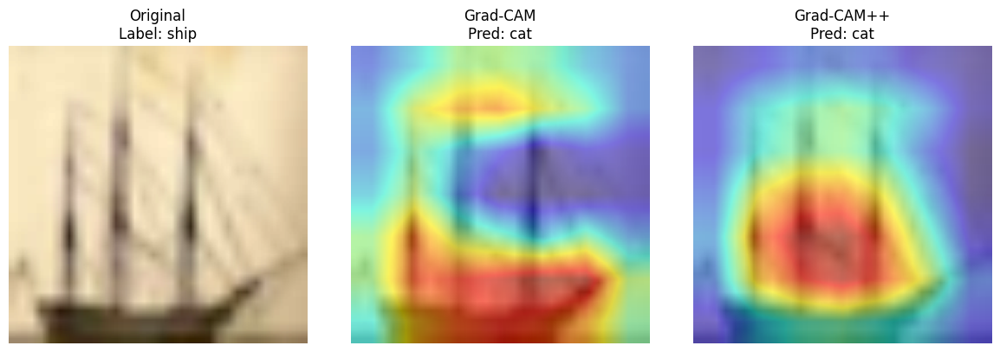

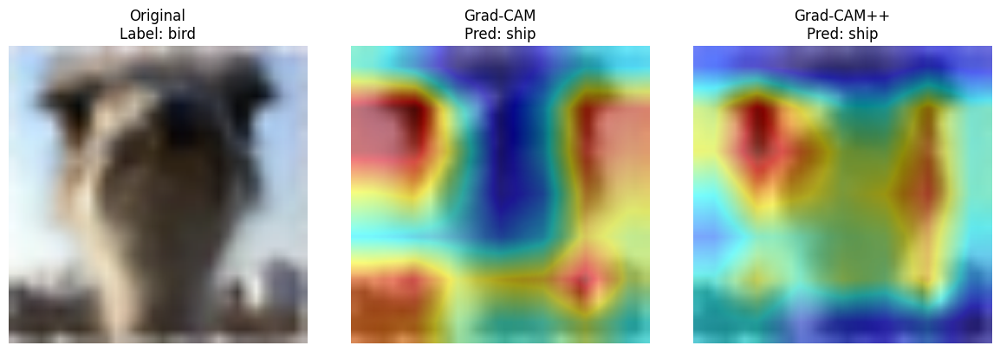

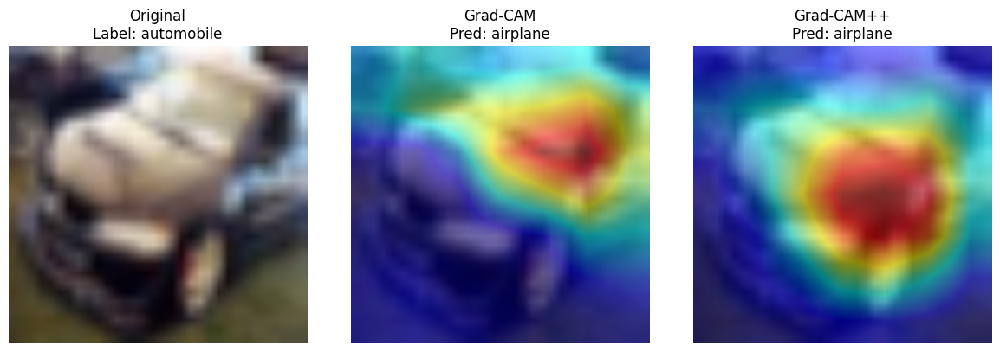

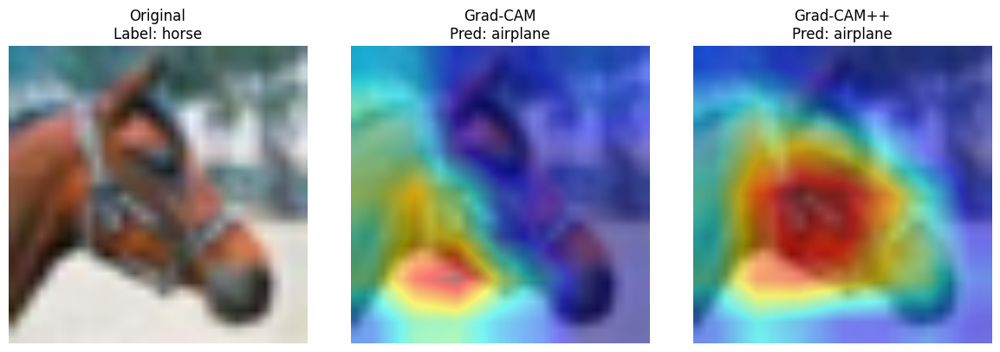

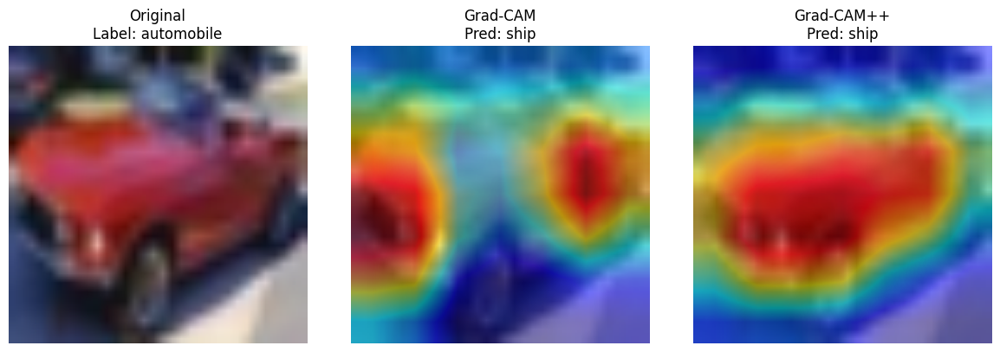

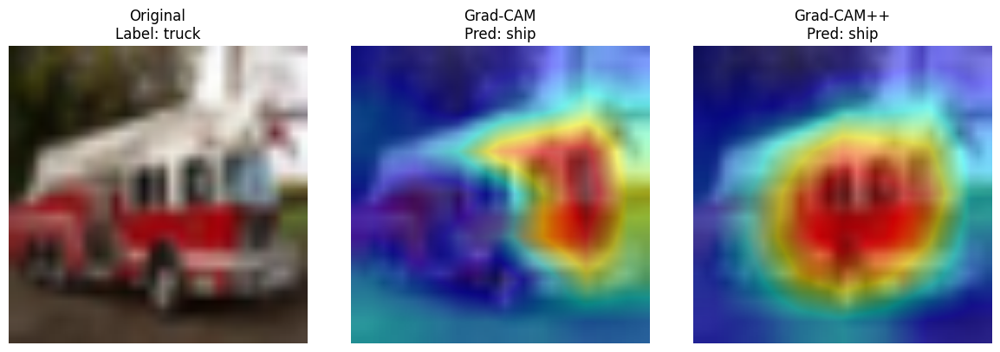

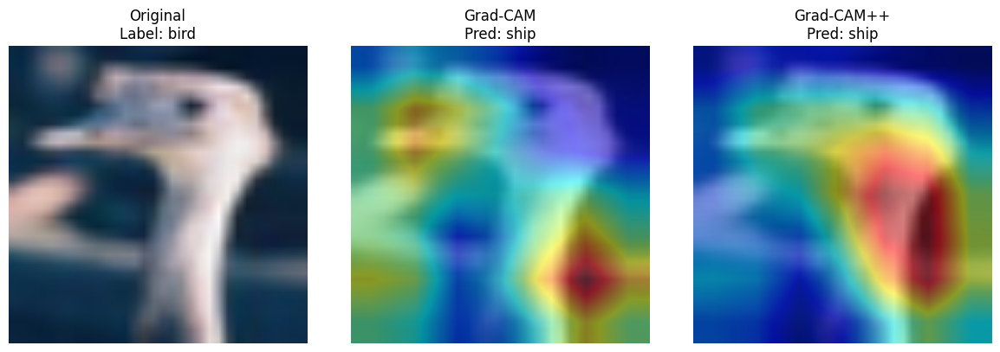

Top misclassified candidates saved and displayed inline.


In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
from torchvision.models import resnet18

from pytorch_grad_cam import GradCAM, GradCAMPlusPlus
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image


# ---------------------------
# Load your model
# ---------------------------
model.eval()

target_layer = model.layer4[-1]  # last block

# ---------------------------
# Grad-CAM setup
# ---------------------------
cam = GradCAM(model=model, target_layers=[target_layer])
cam_pp = GradCAMPlusPlus(model=model, target_layers=[target_layer])

# ---------------------------
# Directory to save candidates
# ---------------------------
os.makedirs("gradcam_misclassified", exist_ok=True)

# ---------------------------
# Loop through a subset
# ---------------------------
subset_size = 500  # adjust as needed
candidates = []

for idx in range(subset_size):
    img, label = test_dataset[idx]
    input_tensor = img.unsqueeze(0).to(device)
    input_rgb = img.permute(1,2,0).numpy()
    input_rgb = (input_rgb - input_rgb.min()) / (input_rgb.max() - input_rgb.min())

    # Model prediction
    with torch.no_grad():
        pred_class = model(input_tensor).argmax(dim=1).item()

    # Only keep misclassified
    if pred_class == label:
        continue

    targets = [ClassifierOutputTarget(pred_class)]

    # Compute Grad-CAM and Grad-CAM++
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]
    grayscale_cam_pp = cam_pp(input_tensor=input_tensor, targets=targets)[0]

    # Normalize
    grayscale_cam = (grayscale_cam - grayscale_cam.min()) / (grayscale_cam.max() - grayscale_cam.min() + 1e-8)
    grayscale_cam_pp = (grayscale_cam_pp - grayscale_cam_pp.min()) / (grayscale_cam_pp.max() - grayscale_cam_pp.min() + 1e-8)

    # Compute difference score
    diff_score = np.abs(grayscale_cam_pp - grayscale_cam).mean()
    candidates.append((diff_score, idx, input_rgb, grayscale_cam, grayscale_cam_pp, pred_class, label))

# ---------------------------
# Sort candidates by difference
# ---------------------------
candidates.sort(reverse=True, key=lambda x: x[0])
top_n = 10

for rank, (diff_score, idx, input_rgb, gcam, gcam_pp, pred_class, label) in enumerate(candidates[:top_n]):
    cam_image = show_cam_on_image(input_rgb, gcam, use_rgb=True)
    cam_pp_image = show_cam_on_image(input_rgb, gcam_pp, use_rgb=True)

    fig, axes = plt.subplots(1,3, figsize=(12,4))
    axes[0].imshow(input_rgb)
    axes[0].set_title(f"Original\nLabel: {class_names[label]}")
    axes[0].axis('off')
    axes[1].imshow(cam_image)
    axes[1].set_title(f"Grad-CAM\nPred: {class_names[pred_class]}")
    axes[1].axis('off')
    axes[2].imshow(cam_pp_image)
    axes[2].set_title(f"Grad-CAM++\nPred: {class_names[pred_class]}")
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()  # show inline
    #plt.savefig(f"gradcam_misclassified/candidate_{rank}_idx{idx}.png")
    plt.close()

print("Top misclassified candidates saved and displayed inline.")


**Observations**:

The Grad-CAM heatmaps tend to highlight the surrounding regions while Grad-CAM++ heatmaps highlight the core object regions. So when the strongest attribution and consistent attribution differs, the model tends to get confused and misclassifies.

##SSIM (Structural Similarity Index Measure)
**Concept:**
SSIM evaluates the similarity between two images based on structural information, luminance, and contrast. In this context, it measure how closely the heatmaps align. Higher value indicates more similarity.

##MAD (Mean Absolute Deviation)

**Concept:**
 MAD quantifies the average absolute pixel-level deviation between the two heatmaps, lower MAD values indicate more accurate and consistent explanations.

In [ ]:
mad_scores = []  # store MAD for each misclassified image

for idx in range(subset_size):
    img, label = test_dataset[idx]
    input_tensor = img.unsqueeze(0).to(device)
    input_rgb = img.permute(1,2,0).numpy()
    input_rgb = (input_rgb - input_rgb.min()) / (input_rgb.max() - input_rgb.min())

    # Model prediction
    with torch.no_grad():
        pred_class = model(input_tensor).argmax(dim=1).item()

    # Only misclassified
    if pred_class == label:
        continue

    targets = [ClassifierOutputTarget(pred_class)]

    # Compute heatmaps
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]
    grayscale_cam_pp = cam_pp(input_tensor=input_tensor, targets=targets)[0]

    # Normalize
    grayscale_cam = (grayscale_cam - grayscale_cam.min()) / (grayscale_cam.max() - grayscale_cam.min() + 1e-8)
    grayscale_cam_pp = (grayscale_cam_pp - grayscale_cam_pp.min()) / (grayscale_cam_pp.max() - grayscale_cam_pp.min() + 1e-8)

    # Compute MAD
    mad = np.abs(grayscale_cam_pp - grayscale_cam).mean()
    mad_scores.append(mad)  # store for aggregate analysis

    # (Optional) visualization
    cam_image = show_cam_on_image(input_rgb, grayscale_cam, use_rgb=True)
    cam_pp_image = show_cam_on_image(input_rgb, grayscale_cam_pp, use_rgb=True)


In [ ]:
from skimage.metrics import structural_similarity as ssim

ssim_scores = []

for idx in range(subset_size):
    img, label = test_dataset[idx]
    input_tensor = img.unsqueeze(0).to(device)
    input_rgb = img.permute(1,2,0).numpy()
    input_rgb = (input_rgb - input_rgb.min()) / (input_rgb.max() - input_rgb.min())

    # Model prediction
    with torch.no_grad():
        pred_class = model(input_tensor).argmax(dim=1).item()

    # Only misclassified
    if pred_class == label:
        continue

    targets = [ClassifierOutputTarget(pred_class)]

    # Compute heatmaps
    grayscale_cam = cam(input_tensor=input_tensor, targets=targets)[0]
    grayscale_cam_pp = cam_pp(input_tensor=input_tensor, targets=targets)[0]

    # Normalize to [0,1]
    grayscale_cam = (grayscale_cam - grayscale_cam.min()) / (grayscale_cam.max() - grayscale_cam.min() + 1e-8)
    grayscale_cam_pp = (grayscale_cam_pp - grayscale_cam_pp.min()) / (grayscale_cam_pp.max() - grayscale_cam_pp.min() + 1e-8)

    # Compute SSIM
    score = ssim(grayscale_cam, grayscale_cam_pp, data_range=1.0)  # because normalized to [0,1]
    ssim_scores.append(score)


In [ ]:
print(f"Average SSIM: {np.mean(ssim_scores):.4f}")
print(f"Min SSIM: {np.min(ssim_scores):.4f}")
print(f"Average MAD: {np.mean(mad_scores):.4f}")
print(f"Max MAD: {np.max(mad_scores):.4f}")


Average SSIM: 0.8408
Min SSIM: 0.4372
Average MAD: 0.0932
Max MAD: 0.2829


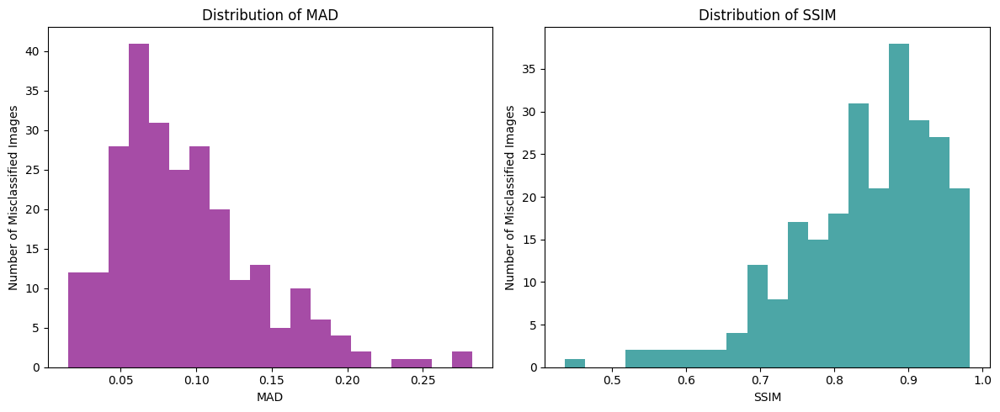

In [ ]:
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.hist(mad_scores, bins=20, color='purple', alpha=0.7)
plt.xlabel("MAD")
plt.ylabel("Number of Misclassified Images")
plt.title("Distribution of MAD")

plt.subplot(1,2,2)
plt.hist(ssim_scores, bins=20, color='teal', alpha=0.7)
plt.xlabel("SSIM")
plt.ylabel("Number of Misclassified Images")
plt.title("Distribution of SSIM")

plt.tight_layout()
plt.show()
